# ASSIGNMENT:

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

models_path = "../dataset/models/"
scenes_path = "../dataset/scenes/"

products_A = {i: f"{models_path}ref{i}.png" for i in range(1, 15)}
products_B = {i: f"{models_path}ref{i}.png" for i in range(15, 28)}

scenes_A = {i: f"{scenes_path}scene{i}.png" for i in range(1, 6)}
scenes_B = {i: f"{scenes_path}scene{i}.png" for i in range(6, 13)}

### Show the dataset

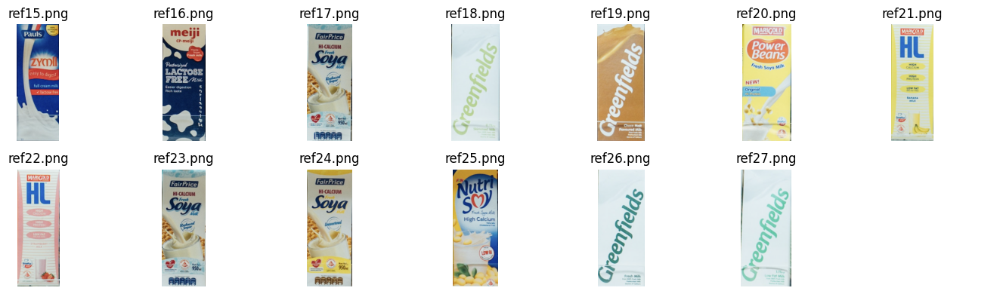

In [469]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, product in enumerate(products_B):
    axes[i].imshow(cv2.cvtColor(cv2.imread(products_B[product]), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(products_B[product][len(models_path):])
    if i == len(products_B)-1:
        for ax in axes[i+1:]:
            ax.axis('off')

plt.tight_layout()
plt.show()

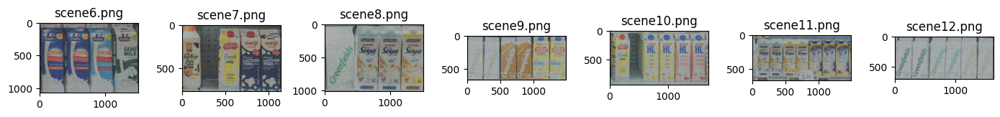

In [470]:
fig, axes = plt.subplots(1, 7, figsize=(14, 4))
axes = axes.flatten()

read_noisy_scenes_B = {}
for i, scene in enumerate(scenes_B):
    image = cv2.cvtColor(cv2.imread(scenes_B[scene]), cv2.COLOR_BGR2RGB)
    read_noisy_scenes_B[scene] = image
    axes[i].imshow(image)
    axes[i].set_title(scenes_B[scene][len(scenes_path):])

plt.tight_layout()
plt.show()

In [471]:
def denoise_image(image, filters):
    '''
    Apply denoising filters to the input image.

    Parameters:
    image (array_like): The input image to be denoised.
    filters (list of dict): A list of dictionaries, each representing a denoising filter to be applied.
        Each dictionary should have the following keys:
            - name (str): The name of the filter.
            - n_iter (int): The number of iterations to apply the filter.
            - params (dict): A dictionary containing parameters specific to the filter.

    Returns:
    array_like: The denoised image.

    Example:
    >>> denoised_image = denoise_image(input_image, [
    >>>     {"name": "mean", "n_iter": 1, "params": {"ksize": 7}},
    >>>     {"name": "median", "n_iter": 1, "params": {"ksize": 5}},
    >>>     {"name": "bilateral", "n_iter": 1, "params": {"d": 3, "sigmaColor": 2, "sigmaSpace": 1.5}},
    >>>     {"name": "gaussian", "n_iter": 1, "params": {"sigmaX": 2}},
    >>>     {"name": "non_local_means", "n_iter": 1, "params": {"templateWindowSize": 5, "searchWindowSize": 21, "h": 3, "hColor": 20}},
    >>>     {"name": "canny", "n_iter": 1, "params": {"threshold1": 5, "threshold2": 21}},
    >>>     {"name": "sharpen", "n_iter": 1, "params": {}}, # 3x3 kernel
    >>>     {"name": "emboss", "n_iter": 1, "params": {}}   # 3x3 kernel
    >>> ])
    '''
    for filter in filters:
        for _ in range(filter['n_iter']):
            match filter['name']:
                case "mean":
                    '''
                    {"ksize" : 15}
                    '''
                    k_size = filter['params']['ksize']
                    mean_kernel = np.ones([k_size, k_size])/(k_size**2)
                    image = cv2.filter2D(image, -1, mean_kernel)
                case "median":
                    '''
                    {"ksize" : 11}
                    '''
                    image = cv2.medianBlur(image, **filter['params'])
                case "bilateral":
                    '''
                    {"d" : 3,
                    "sigmaColor" : 2,
                    "sigmaSpace" : 1.5}
                    '''
                    image = cv2.bilateralFilter(image, **filter['params'])
                case 'gaussian':
                    '''
                    {"sigmaX" : 2}
                    '''
                    sigmaX = filter['params']['sigmaX']
                    ksize = 2*int(np.ceil(3*sigmaX)) + 1
                    image = cv2.GaussianBlur(image, (ksize, ksize), sigmaX)
                case 'non_local_means':
                    '''
                    {'templateWindowSize':5,"searchWindowSize":21, "h":3, "hColor": 20}
                    '''
                    image = cv2.fastNlMeansDenoisingColored(image, **filter['params'])
                case 'canny':
                    '''
                    {'threshold1':5,"threshold2":21}
                    '''
                    image = cv2.Canny(image, **filter['params'])
                case 'sharpen':
                    kernel = np.array([[0, -1, 0],
                                       [-1, 5, -1],
                                       [0, -1, 0]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case 'emboss':
                    kernel = np.array([[-2, -1, 0],
                                       [-1, 1, 1],
                                       [0, 1, 2]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case _: pass
    return image

In [475]:
def diagonal(points, point2=None):
    if point2:
        return np.sqrt(np.abs((points[0]-point2[0])**2+(points[1]-point2[1])**2))
    return np.sqrt(np.abs(np.sum(np.subtract(points[:1, :], points[1:, :])**2)))


def get_geometry(corners):
    '''
    returns position(x,y), width, height.

    The center position is computed with the mean value of the x-coord and y-coord.
    Width and height using point-distance, knowing that the order of the points
    returned by the homography method is always the same (TL,BL,BR,TR)
    '''
    return {'position': tuple(np.round((np.sum(corners, axis=0)/4)[0], 0).astype(int)),
            'width': int(f'{diagonal(corners[1:3,:]):0.0f}'),
            'height': int(f'{diagonal(corners[:2,:]):0.0f}')
            }

In [477]:
def get_angles(geometry_dict):
    '''
    return the angles with shape (4,1,2)
    '''
    center_x, center_y = geometry_dict['position']
    width = geometry_dict['width']
    height = geometry_dict['height']
    
    top_left = np.array([center_x - width/2, center_y + height/2])
    bottom_left = np.array([center_x - width/2, center_y - height/2])
    bottom_right = np.array([center_x + width/2, center_y - height/2])
    top_right = np.array([center_x + width/2, center_y + height/2])
    corners = np.array([top_left, bottom_left, bottom_right, top_right]).reshape(4, 1, 2)
    
    return corners

In [481]:
def inside(center, image_shape):  # center is (x;y), shape is (rows,columns)
    '''
    used to detect if a point (the center of the bounding box) is inside the scene image
    '''
    return (
        center[0] >= 0
        and center[0] < image_shape[1]
        and center[1] >= 0
        and center[1] < image_shape[0]
        )


def remove_outside_products_SI(results):
    for scene in results:
        for product in results[scene]:
            center=results[scene][product]['geometry']['position']
            if not inside(center,read_noisy_scenes_A[scene].shape):
                results[scene][product]['flag']=False

In [485]:
def check_boundings(point, geometry):
    '''
    checks wheter or not a point is inside a bounding box (computed using `get_geometry`)
    '''
    try:
        pointX, pointY = point
        centerX, centerY = geometry['position']
        sizeX = geometry['width']
        sizeY = geometry['height']
        return (
            centerX-sizeX/2 <= pointX 
            and pointX <= centerX+sizeX/2 
            and centerY-sizeY/2 <= pointY 
            and pointY <= centerY+sizeY/2
            )
    except ValueError:
        return False

In [487]:
def display_settings(settings, match_count=None, value=None):
    '''
    print used filters and eventually additional settings
    '''
    aux = [filter for filter in settings if ('matching_settings' in filter.keys() or filter['n_iter'] > 0)]
    print('Denoise settings:')
    display(aux)
    if value:
        print(f'tollerance on template matcher: {value}')
    if match_count:
        print(f'min_match:{match_count}')


def print_single_instances(results: dict, min_match, return_dict=False):
    # variables used to format the string
    max_product_len = max(len(str(product))for scene in results for product in results[scene].keys())
    max_match_len = max(len(str(results[scene][product]["match_count"]))for scene in results for product in results[scene])
    max_x_len = max(len(str(results[scene][product]["geometry"]["position"][0])) for scene in results for product in results[scene] if inside(
        results[scene][product]['geometry']['position'], read_noisy_scenes_A[scene].shape))
    max_y_len = max(len(str(results[scene][product]["geometry"]["position"][1])) for scene in results for product in results[scene] if inside(
        results[scene][product]['geometry']['position'], read_noisy_scenes_A[scene].shape))
    max_width_len = max(len(str(results[scene][product]["geometry"]["width"]))for scene in results for product in results[scene])
    max_height_len = max(len(str(results[scene][product]["geometry"]["height"]))for scene in results for product in results[scene])

    if return_dict:
        results_dict = {}

    for scene in results.keys():
        if return_dict:
            results_dict[scene] = {}
        print(f'Scene {scene}:')
        for product in results[scene].keys():
            if (  # the product must have a certain amount of matches
                    results[scene][product]['match_count'] >= min_match and
                # set to false in `remove_overlapping_products_match_count` if refs refers to the same product (they both think to be the same product)
                    results[scene][product]['flag']):
                if return_dict:
                    results_dict[scene][product] = results[scene][product]
                    
                print(f"\tProduct {str(product)+',':<{max_product_len+1}}"
                      # + f" matches: {str(results[scene][product]['match_count'])+',':<{max_match_len+1}}"
                      + f" {{position: ({str(results[scene][product]['geometry']['position'][0])+',':<{max_x_len+1}}"
                      + f" {str(results[scene][product]['geometry']['position'][1])+'),':<{max_y_len}}"
                      + f" width: {str(results[scene][product]['geometry']['width'])+',':<{max_width_len}}"
                      + f" height: {results[scene][product]['geometry']['height']:<{max_height_len-1}}}}")
    if return_dict:
        return results_dict

## TRACK B

Let's apply SIFT on the products, store the keypoints and the descriptors found.

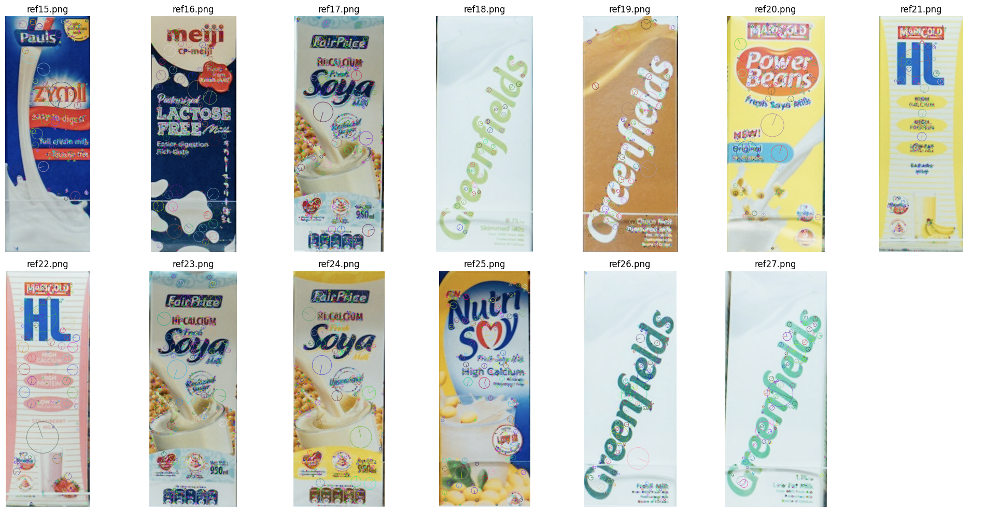

In [491]:
SHOW_KEYPOINTS = True

products_info_B = {}
read_products_B = {}
if SHOW_KEYPOINTS:
    fig, axes = plt.subplots(2, 7, figsize=(20, 10))
    axes = axes.flatten()

for i, product in enumerate(products_B):
    image = cv2.imread(products_B[product])
    read_products_B[product] = image
    sift = cv2.SIFT_create()
    keypoints = sift.detect(image)
    products_info_B[product] = list(sift.compute(image, keypoints))
    if SHOW_KEYPOINTS:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_RGB2BGR))
        axes[i].axis('off')
        axes[i].set_title(products_B[product][len(models_path):])
        if i == len(products_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS:
    plt.tight_layout()
    plt.show()

In [494]:
def normalize(image):
    '''
    Normalizes the image to 0-255, 
    calculating new values through linear interpolation
    '''
    max_value = np.max(image)
    new_image = np.interp(image, (0, max_value), (0, 255)).astype('uint8')
    return new_image

As for earlier, we used median filters. This time we do a bit less denoising, the images are smaller and we would lose too many details.

In [495]:
settings_B = [
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
    }
]

In [496]:
SHOW_KEYPOINTS = False
SHOW_FILTERED = False

if SHOW_KEYPOINTS or SHOW_FILTERED:
    fig, axes = plt.subplots(4, 2, figsize=(14, 20))
    axes = axes.flatten()

scenes_info_B = {}
read_scenes_B = {}
read_scenes_noisy_B = {}
for i, scene in enumerate(scenes_B):
    image = cv2.imread(scenes_B[scene])
    read_scenes_noisy_B[scene] = image
    filtered_image = denoise_image(image, settings_B)
    sift = cv2.SIFT_create()
    keypoints = sift.detect(filtered_image)
    filtered_image = normalize(filtered_image)
    read_scenes_B[scene] = filtered_image
    scenes_info_B[scene] = list(sift.compute(filtered_image, keypoints))+[image.shape]
    if SHOW_KEYPOINTS or SHOW_FILTERED:
        printable_image = image
        if SHOW_FILTERED:
            printable_image = filtered_image
        if SHOW_KEYPOINTS:
            printable_image = cv2.drawKeypoints(filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(printable_image, cv2.COLOR_BGR2RGB))
        axes[i].set_title(scenes_B[scene][len(scenes_path):])
        # remove unused subplots
        if i == len(scenes_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS or SHOW_FILTERED:
    plt.tight_layout()
    plt.show()

To compare histograms we can use a lot of different metrics from _openCV_ and the method `cv2.compareHist`. Sperimentally the only working metric was `cv2.HISTCMP_INTERSECT`

In [497]:
def get_histogram_score(product, scene, homography_geometry, method = cv2.HISTCMP_INTERSECT):
    '''
    `method` possibilities: HISTCMP_CORREL, HISTCMP_CHISQR, HISTCMP_INTERSECT, HISTCMP_BHATTACHARYYA, HISTCMP_HELLINGER, HISTCMP_CHISQR_ALT, HISTCMP_KL_DIV
    '''
    # if we want to use an higher number of bins (possibly up to 256(0, 255) it won't be possible to use HISTCMP_CORREL as metric
    # with the images we're using, since they're quite big and the compare method will return nan
    hist_sizes = [16, 16, 16]  
    ranges = [0, 256, 0, 256, 0, 256]
    product_image = read_products_B[product]
    scene_image = read_scenes_B[scene]
    scene_corners = get_angles(homography_geometry)
    
    # Slicing images where product is found
    row_min = min(max(int(min(a[0][1] for a in scene_corners)), 0), scene_image.shape[0]-1)
    row_max = max(min(int(max(a[0][1] for a in scene_corners)), scene_image.shape[0]-1),0)
    col_min = min(max(int(min(a[0][0] for a in scene_corners)), 0), scene_image.shape[1]-1)
    col_max = max(min(int(max(a[0][0] for a in scene_corners)), scene_image.shape[1]-1),0)
    scene_image = scene_image[row_min:row_max+1, col_min:col_max+1]
    
    # Computing histograms
    product_hists = cv2.calcHist([product_image], [0,1,2], None, hist_sizes, ranges)
    scene_hists = cv2.calcHist([scene_image], [0,1,2], None, hist_sizes, ranges)

    # Compare the histograms
    score = cv2.compareHist(product_hists, scene_hists, method)
    
    return score

Initially we tried to use SIFT similarly to track A. The main problem is that due to the noisness of the images some product would never be found using SIFT keypoints, namely product 18. A lot of different filters were tried with zero results. 

We had to find an approach different from SIFT to detect those missing products.  
Given that all the scenes had a bunch of products with similar, or even same, dimensions. We decided to try `cv2.matchTemplate`, to at least see wheter or not product 18 would be find.  

To be able to use the template matcher, we have to ensure that the dimension of the template and the products in the scene are the same. Luckily we can use SIFT on the scenes, one at the time, to at least check the shape of the products that were found. In particular we use the width and height of the product found by SIFT with the most number of matches. We know that this is correct because when we tried toonly use SIFT the majority of the products were correctly identified, therefore the better recognized one is correct.

At this point we had the size of the template to use, and for each scene we apply the method for every product.

The next big deal is the enormous number of bounding boxes found, due to the low score threshold we have to use. It must me low because the difference between the original products and the denoised scenes is still pretty big, being the scene really noisy. 

The solution is pretty naive and consists in only storing the next bounding box found if it is 'far' from every other box saved. The simple function is the following:

In [498]:
def close_geometries(geom1, geom2, tolerance=40):
    '''
	Compare the distance between the centers.
    (The width and height will be the same due to the template window being of the same size)
    '''
    if (abs(geom1['position'][0] - geom2['position'][0]) <= tolerance and
        abs(geom1['position'][1] - geom2['position'][1]) <= tolerance):
        return True
    return False

One last thing: the points returned by the _openCV_ method are the top-left and the bottom-right of the correspondance found. We simply need to cast it into four points, in a format usable by `cv2.polylines` therefore with shape (4,1,2).

In [499]:
def get4corners(top_left, bottom_right):
    '''
    return the 4 corners of a bounfing box, given the
    top left and the bottom right, returned by the template
    mathcer. Output is returned with shape (4,1,2)
    '''
    tl_x, tl_y = top_left
    br_x, br_y = bottom_right
    tr_x, tr_y = br_x, tl_y
    bl_x, bl_y = tl_x, br_y

    return np.array([[tl_x, tl_y], [bl_x, bl_y], [br_x, br_y], [tr_x, tr_y]]).reshape((4, 1, 2))

Finally we can compute our bounding boxes:

In [520]:
PRINT_PROGRESS=False

# threshold for the template matcher. This is relatively small cause of the noisness of the images compared to the refs
MIN_RESULT_VALUE = 0.27
# resulting matches/positions will be stored here
results_B = {}
for scene in scenes_info_B:
    results_B[scene] = {}
    best=0
    geom={}
    prod=0
    # find the best product, in therms of match count, used to get the dimensions of the window
    if PRINT_PROGRESS:print(f'----------SCENE {scene}----------')
    for product in products_info_B:
        try:
            # we had to remove the random factor. We could not figure out what was not working when every execution of the code gave a different output
            matcher = cv2.BFMatcher()
            matches = matcher.knnMatch(products_info_B[product][1], scenes_info_B[scene][1], k=2)
            good = []
            for m, n in matches:
                if m.distance < 0.8*n.distance:
                    good.append(m)
            src_pts = np.float32([products_info_B[product][0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([scenes_info_B[scene][0][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            matchesMask = mask.ravel().tolist()
            h, w = read_products_B[product].shape[:2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],[w-1, 0]]).reshape(-1, 1, 2)
            dst = np.int32(cv2.perspectiveTransform(pts, M))
            matches=np.sum(matchesMask)
            if matches>best:
                prod=product
                best=matches
                geom=get_geometry(dst)
            if PRINT_PROGRESS:print(f'matches for product {product}: {matches}')
        except: 
            print('\terror on SIFT')
    try:
        w=geom['width']
        h=geom['height']
    except:
        print('error with geom dict')

    if PRINT_PROGRESS:print('=======',f'best product found for scene {scene} is {prod} with {best} matches, size is w:{w}, h:{h}')
    # now use that window to compute template matching
    for product in products_info_B:
        positions_used=[]
        results_B[scene][product] = []
        # resize the product with the found dimension
        try:
            if PRINT_PROGRESS:print(f'matching {product} on scene {scene}')
            resized_product=cv2.resize(read_products_B[product],(w,h),interpolation=1)
            # search the template
            result = cv2.matchTemplate(read_scenes_B[scene], resized_product, cv2.TM_CCOEFF_NORMED)
            locations = np.where(result >= MIN_RESULT_VALUE)
            for loc in zip(*locations[::-1]):
                top_left=loc
                bottom_right=(top_left[0] + resized_product.shape[1], top_left[1] + resized_product.shape[0])
                angles=get4corners(top_left,bottom_right)
                geom=get_geometry(angles)

                # only append this box if it is in a position of a possible next product, 
                # and not in the same spot again
                interrupt=False
                if len(positions_used) > 0:
                    # new method: check if the current geom is 'similar'to one already stored
                    for old_geom in positions_used:
                        if close_geometries(geom,old_geom):
                            interrupt=True
                            break
                        
                if interrupt:
                    continue
                results_B[scene][product].append({
                    'match_count': np.inf,
                    'geometry': geom,
                    'flag':True,
                    'score': get_histogram_score(product,scene, homography_geometry=geom, method=cv2.HISTCMP_INTERSECT)
                    }
                )
                positions_used.append(geom)
            if PRINT_PROGRESS: print(f'found {len(results_B[scene][product])} instances')
        except cv2.error:
            print('\terror on matcher',cv2.error)

	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT
	error on SIFT


As for early, we inspect the bounding boxes obtained:

In [521]:
def plot_MI_bounding_boxes(results,colorRange=200,drawCircles=True,useNoisyScenes=True):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    for i, scene in enumerate(results):
        image=read_scenes_B[scene].copy()
        if useNoisyScenes:
            image=read_scenes_noisy_B[scene].copy()
        prods=len(results[scene].keys())
        for c,products in enumerate(results[scene]):
            for instance in results[scene][products]:
                if instance['flag']:
                    points = get_angles(instance['geometry'])
                    color=[0,255-colorRange+colorRange*(prods-(c+1))/prods,0]
                    image = cv2.polylines(image, [np.int32(points)], True, color, 15, cv2.LINE_AA)
                    text=f'{products}'
                    px,py=instance['geometry']['position']
                    if drawCircles:
                        image=cv2.circle(image,(px,py),65,color,-1)
                        text_color=[255]*3
                    else: 
                        text_color=0
                    px-=60
                    py+=30
                    image=cv2.putText(image,text,(px,py),cv2.FONT_HERSHEY_PLAIN,6,text_color,5)
        axes[i].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
        axes[i].set_title(f'Scene {scene}')
        if i == len(scenes_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

    plt.tight_layout()
    plt.show()

In [522]:
first_res_B=results_B.copy()

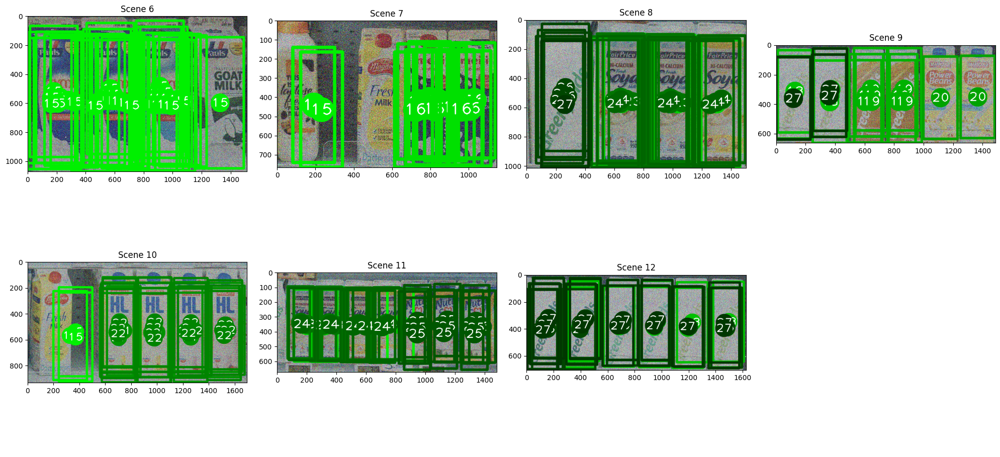

In [523]:
plot_MI_bounding_boxes(first_res_B)

### Methods used to filter the results

Having used the template matcher, we don't have any instance outside the scene nor boxes with some akward shapes. We can directly compare the histogram scores of each instance to remove any duplicates.

In [524]:
def remove_overlapping_products_hist_comparing(results,method='histogram_comparing',show_actions = False):
    '''
    Multiple Instance:
	for every couple of instances in the same scene, if two products happen
    to be in the same region, only keep the one with the most matches.

    method='histogram_comparing' means that we search for bounding boxes with
    center inside another bounding box, if so only keep the one with the best 
    score obtained with the histogram comparing between the window in the scene
    and the product assigned to that section of the image.
    '''
    for scene in results:
        keys=results[scene]
        for product1 in keys:
            for product2 in keys:
                for instance1 in range(len(results[scene][product1])):
                    # if a product is already flagged to false, do not compute it
                    if not results[scene][product1][instance1]["flag"]: 
                        continue
                    for instance2 in range(len(results[scene][product2])):
                        # if a product is already flagged to false, do not compute it
                        if not results[scene][product2][instance2]["flag"]:
                            continue
                        # if we check a product with himself we continue
                        if product1==product2 and instance1==instance2:
                            continue
                        # same as in track A, the match was used to test a bunch a strategies
                        match method:
                            case 'histogram_comparing':
                                point=results[scene][product1][instance1]["geometry"]["position"]
                                if check_boundings(point,results[scene][product2][instance2]["geometry"]):
                                    score1 = results[scene][product1][instance1]["score"]
                                    score2 = results[scene][product2][instance2]["score"]
                                    if show_actions:
                                        print(f'{scene}: {product1, point} and {product2,results[scene][product2][instance2]["geometry"]["position"]} concentric:\n1:{score1} - 2: , {score2}')
                                    # compare the histogram score of the two instances
                                    # the abs is due to old metrics that could have been negtive
                                    if np.abs(score1) > np.abs(score2):
                                        # when choosing what instance to remove, we only remove it if the other one isn't removed
                                        # this is a safe measure whenever two instances would have the same score
                                        # and both of them would be removed
                                        results[scene][product2][instance2]["flag"] = False
                                    else:
                                        results[scene][product1][instance1]["flag"] = False

### Print methods

In [525]:
def print_multiple_instances(results: dict,return_dict=False,orderPositions=True, showScores=False):
    max_product_len = max(len(str(product)) for scene in results for product in results[scene])
    max_instance_len = max(len(str(len(results[scene][product]))) for scene in results for product in results[scene])
    max_match_len = max(len(str(product["match_count"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_score_len = max(len(str(product["score"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_x_len = max(len(str(product["geometry"]["position"][0])) for scene in results for products in results[scene] for product in results[scene][products])# if inside(product['geometry']['position'], scenes_info_B[scene-1][2]))
    max_y_len = max(len(str(product["geometry"]["position"][1])) for scene in results for products in results[scene] for product in results[scene][products])# if inside(product['geometry']['position'], scenes_info_B[scene-1][2]))
    max_width_len = max(len(str(product["geometry"]["width"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_height_len = max(len(str(product["geometry"]["height"])) for scene in results for products in results[scene] for product in results[scene][products])

    if return_dict:
        results_dict={}

    for i,scene in enumerate(results):
        if return_dict:
            results_dict[scene]={}
        print(f'Scene {scene}:')
        for products in results[scene]:
            printable_prods=[]
            for instance in results[scene][products]:
                if instance['flag']:
                    printable_prods.append(instance)
            num_inside=len(printable_prods)
            if num_inside>0:
                if return_dict:
                    results_dict[scene][products]=[]
                print(f"\tProduct {products:<{max_product_len}} - {num_inside} instance found:")
                if orderPositions: printable_prods = sorted(printable_prods, key=lambda instance: instance['geometry']["position"][0])
                for i,instance in enumerate(printable_prods,1):
                    if return_dict:
                        results_dict[scene][products].append(instance)
                    print(
                    f"\t\tInstance {str(i)+',':<{max_instance_len}}"
                    # + f" matches: {str(instance['match_count'])+',':<{max_match_len+1}}"
                    + (f" score: {str(instance['score'])+',':<{max_score_len+1}}" if showScores else '')
                    + f" {{position: ({str(instance['geometry']['position'][0])+',':<{max_x_len+1}}"
                    + f" {str(instance['geometry']['position'][1])+'),':<{max_y_len}}"
                    + f" width: {str(instance['geometry']['width'])+'px,':<{max_width_len}}"
                    + f" height: {str(instance['geometry']['height'])+'px':<{max_height_len-1}}}}"
                    )
    if return_dict:
        return results_dict

### RESULTS

Let's apply the histogram comparing and inspect the results:

In [526]:
# print the filters used, along with some other value
display_settings(settings_B,value=MIN_RESULT_VALUE)

# apply the heurustic from earlier, using the histogram score
remove_overlapping_products_hist_comparing(results_B)
products_found_B=print_multiple_instances(results_B,return_dict=True,orderPositions=True,showScores=True)

Denoise settings:


[{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}}]

tollerance on template matcher: 0.27
Scene 6:
	Product 15 - 4 instance found:
		Instance 1, score: 111053.0, {position: (206,  602), width: 327px, height: 905px}
		Instance 2, score: 111525.0, {position: (590,  542), width: 327px, height: 905px}
		Instance 3, score: 89118.0,  {position: (864,  610), width: 327px, height: 905px}
		Instance 4, score: 69026.0,  {position: (1326, 598), width: 327px, height: 905px}
Scene 7:
	Product 15 - 1 instance found:
		Instance 1, score: 29585.0,  {position: (191,  440), width: 218px, height: 601px}
	Product 16 - 2 instance found:
		Instance 1, score: 64830.0,  {position: (820,  460), width: 218px, height: 601px}
		Instance 2, score: 65167.0,  {position: (960,  462), width: 218px, height: 601px}
Scene 8:
	Product 23 - 2 instance found:
		Instance 1, score: 124296.0, {position: (725,  560), width: 322px, height: 869px}
		Instance 2, score: 124573.0, {position: (984,  576), width: 322px, height: 869px}
	Product 24 - 1 instance found:
		Instance 1, score:

Graphically:

In [527]:
second_res_B=products_found_B.copy()

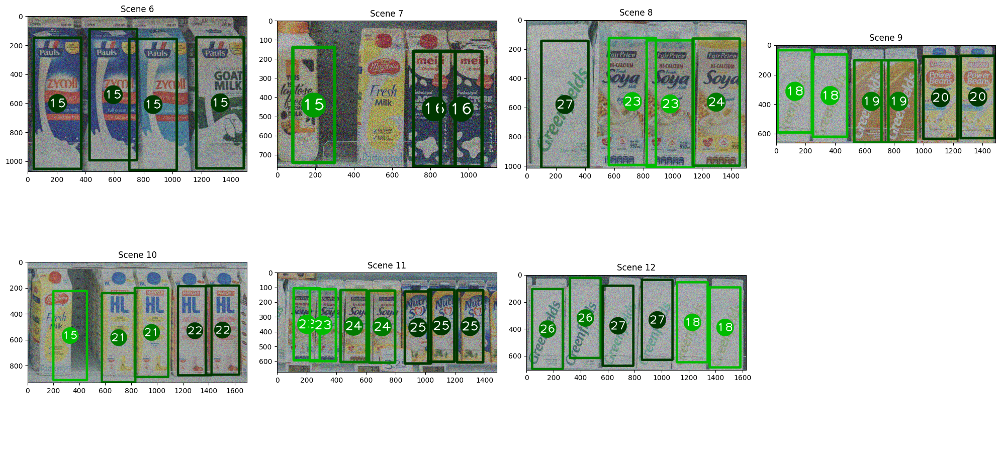

In [528]:
plot_MI_bounding_boxes(second_res_B)

The results are really good. Every product that needed to be found is correctly identified. There are some other products recognized but that are not in our dataset.

We might be happy with the results obtained, but we can provide a couple of thresholds to manage these _ghost products_.  

We can remove the products 15 that appear on the scenes 7 and 10 by noticing that their score (see the above output) is less than 50% of the higher score of the scene.

We can then assume this threshold:

In [529]:
MIN_PERCENTAGE_OF_MAX_SCORE=0.5

Using this notion we can run a doublecheck method and obtain the following results:

In [530]:
def double_check(results,max_thresh=0,instance_thresh=0):
    '''
	removes instances of products whose score is lower than some percentage of the maximum score of the scene
    and if it is lower than a certain percentage of the higher score of the instances of the same product
    '''
    for scene in results:
        max_scene_score=max([inst['score'] for p in results[scene] for inst in results[scene][p] if inst['flag']])
        # print(f'scene {scene}, max is {max_scene_score}')
        for product in results[scene]:
            try:
                max_product_score=max([inst['score'] for inst in results[scene][product] if inst['flag']])
            except ValueError:
                continue
            # print(f'max of {product} in {scene} is {max_product_score}')
            for instance in results[scene][product]:
                if instance['score']<=max_thresh*max_scene_score or instance['score']<=instance_thresh*max_product_score:
                    instance['flag']=False


In [531]:
# this double_check method adds some hard threshold to the instances, in order to remove false positives
double_check(results_B,max_thresh=MIN_PERCENTAGE_OF_MAX_SCORE)
products_found_B=print_multiple_instances(results_B,True,showScores=True)

Scene 6:
	Product 15 - 4 instance found:
		Instance 1, score: 111053.0, {position: (206,  602), width: 327px, height: 905px}
		Instance 2, score: 111525.0, {position: (590,  542), width: 327px, height: 905px}
		Instance 3, score: 89118.0,  {position: (864,  610), width: 327px, height: 905px}
		Instance 4, score: 69026.0,  {position: (1326, 598), width: 327px, height: 905px}
Scene 7:
	Product 16 - 2 instance found:
		Instance 1, score: 64830.0,  {position: (820,  460), width: 218px, height: 601px}
		Instance 2, score: 65167.0,  {position: (960,  462), width: 218px, height: 601px}
Scene 8:
	Product 23 - 2 instance found:
		Instance 1, score: 124296.0, {position: (725,  560), width: 322px, height: 869px}
		Instance 2, score: 124573.0, {position: (984,  576), width: 322px, height: 869px}
	Product 24 - 1 instance found:
		Instance 1, score: 118611.0, {position: (1299, 564), width: 322px, height: 869px}
	Product 27 - 1 instance found:
		Instance 1, score: 67712.0,  {position: (263,  580), wi

In [532]:
third_res=products_found_B.copy()

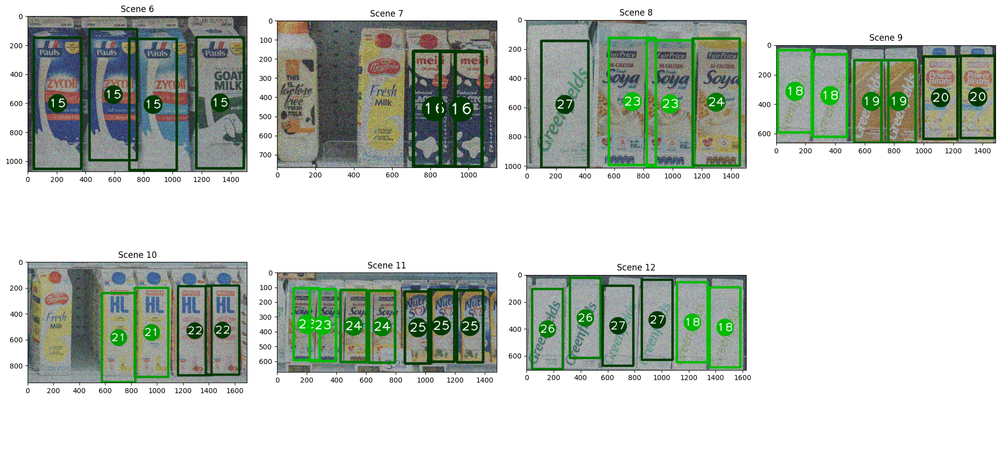

In [533]:
plot_MI_bounding_boxes(third_res)

To remove the remaining products we have to do something a bit aggressive: remove every instance with a score that is lower that a certain treshold compared to the best score of the instances of the same product. Given a scene, in our case the 6th, there are four instances of the product 15.  
The max score of product 15 is 111525, therefore every instance of the product 15 with a score lower than _k_ $\times$ 111525 will be removed.

This is a really hard restriction a lot dependent on the dataset, but with it being a variable, means that an eventual user can move a bit the value and search for an optimal value.

We define this threshold and use it to filter the last products:

In [534]:
MIN_INSTANCE_TRESHOLD=0.82

In [535]:
# this double_check method adds some hard threshold to the instances, in order to remove false positives
double_check(results_B,instance_thresh=MIN_INSTANCE_TRESHOLD)
products_found_B=print_multiple_instances(results_B,True)

Scene 6:
	Product 15 - 2 instance found:
		Instance 1, {position: (206,  602), width: 327px, height: 905px}
		Instance 2, {position: (590,  542), width: 327px, height: 905px}
Scene 7:
	Product 16 - 2 instance found:
		Instance 1, {position: (820,  460), width: 218px, height: 601px}
		Instance 2, {position: (960,  462), width: 218px, height: 601px}
Scene 8:
	Product 23 - 2 instance found:
		Instance 1, {position: (725,  560), width: 322px, height: 869px}
		Instance 2, {position: (984,  576), width: 322px, height: 869px}
	Product 24 - 1 instance found:
		Instance 1, {position: (1299, 564), width: 322px, height: 869px}
	Product 27 - 1 instance found:
		Instance 1, {position: (263,  580), width: 322px, height: 869px}
Scene 9:
	Product 18 - 2 instance found:
		Instance 1, {position: (126,  314), width: 231px, height: 556px}
		Instance 2, {position: (364,  343), width: 231px, height: 556px}
	Product 19 - 2 instance found:
		Instance 1, {position: (644,  382), width: 231px, height: 556px}
		I

And with this last operation we manage to identify all the products of the dataset!

In [536]:
end_res_B=products_found_B.copy()

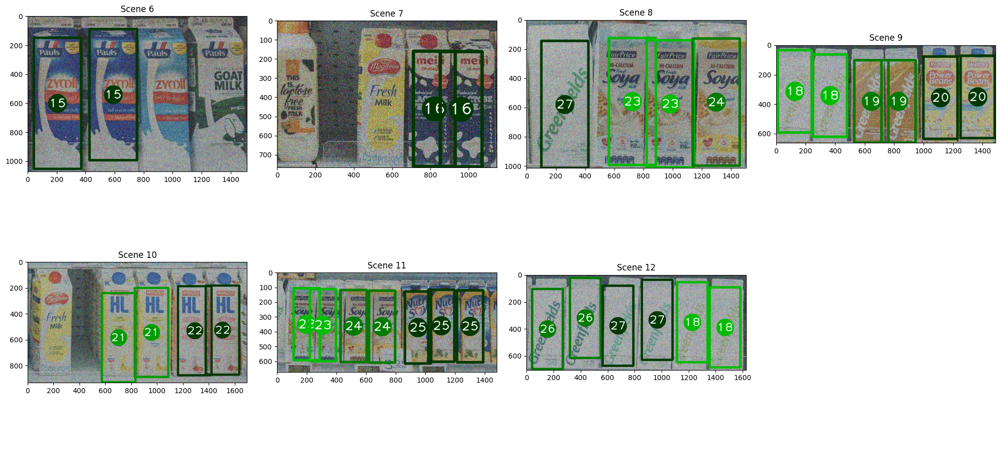

In [537]:
plot_MI_bounding_boxes(end_res_B)